In [2]:
import scanpy as sc
import pandas as pd
import scvi
import scib
import anndata
import numpy as np
import torch
import seaborn as sns
import warnings
import muon as mu
import os
from harmony import harmonize
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")
torch.set_float32_matmul_precision('high')

# RNA

In [2]:
# Load RNA data from GSE164378 (from article : Integrated analysis of multimodal single-cell data)
adata = sc.read_10x_mtx('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/RNA/')
meta = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/meta_3p.csv', index_col=0)
adata.obs = meta
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 161764 × 33538
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'X_index'
    var: 'gene_ids', 'feature_types'

In [4]:
# Remove Eryth and Doublet clusters
adata = adata[adata.obs['celltype.l3'] != 'Eryth']
adata = adata[adata.obs['celltype.l3'] != 'Doublet']

In [5]:
# Filter genes by number of cells expressing gene
sc.pp.filter_genes(adata, min_cells=20)

In [6]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

In [7]:
# Shifted logarithm data normalization
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata)
# Save normalization in raw
# Very important step because scparadise uses normalizaed data in adata.raw!!!
adata.raw = adata

In [8]:
# Find highly variable genes
sc.pp.highly_variable_genes(adata, 
                            n_top_genes=2000, 
                            flavor='seurat_v3', 
                            batch_key='orig.ident',
                            layer='counts',
                            subset=False)

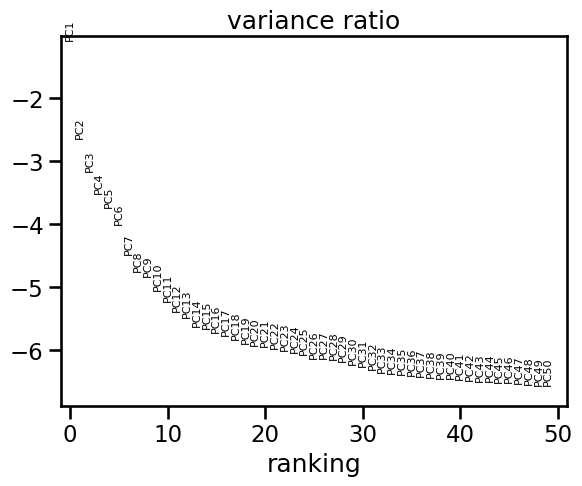

In [9]:
# Dimensionality reduction (principal component analysis) using highly variable genes
sc.tl.pca(adata, use_highly_variable=True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

# ADT

In [10]:
# Load ADT data from GSE164378 (from article : Integrated analysis of multimodal single-cell data)
adata_prot = sc.read_10x_mtx('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/ADT/')
meta = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/meta_3p.csv', index_col=0)
adata_prot.obs = meta
adata_prot.var_names_make_unique()
adata_prot

AnnData object with n_obs × n_vars = 161764 × 228
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'X_index'
    var: 'gene_ids', 'feature_types'

In [11]:
# Remove Eryth and Doublet clusters
adata_prot = adata_prot[adata_prot.obs['celltype.l3'] != 'Eryth']
adata_prot = adata_prot[adata_prot.obs['celltype.l3'] != 'Doublet']

In [12]:
# Add 'adt_' to antibody derived tags names
adata_prot.var_names = ["adt_" + name for name in adata_prot.var_names]

In [13]:
# Save raw counts data
adata_prot.layers["counts"] = adata_prot.X.copy()
adata_prot.X = adata_prot.layers["counts"].copy()

In [14]:
# Normalization of ADT data
mu.prot.pp.clr(adata_prot)

In [15]:
# Remove isotype controls from dataset
isotype_controls = ["adt_Rat-IgG1-1", "adt_Rat-IgG2b", "adt_Rat-IgG1-2", "adt_Rag-IgG2c"]
temp = adata_prot.var.loc[~adata_prot.var.index.isin(isotype_controls), :].index
adata_prot.obsm["X_isotypes"] = adata_prot.X[:, ~adata_prot.var.index.isin(temp.tolist())]
mu.pp.filter_var(adata_prot, var=temp.tolist())

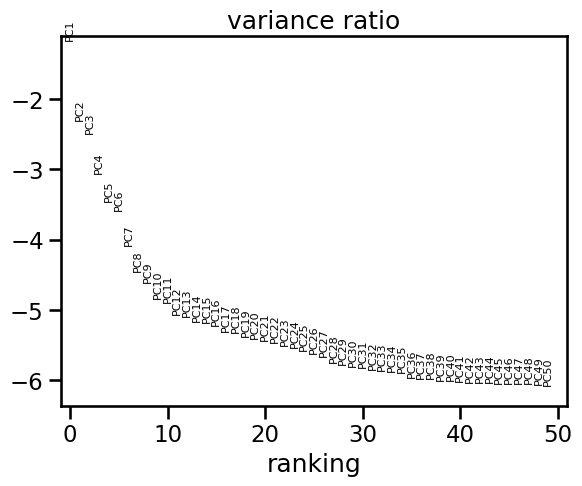

In [16]:
# # Dimensionality reduction (principal component analysis) using all antibody derived tags
sc.tl.pca(adata_prot, use_highly_variable=False)
sc.pl.pca_variance_ratio(adata_prot, n_pcs=50, log=True)

# Create MuData object

In [17]:
mdata = mu.MuData({"rna": adata, "adt": adata_prot})

In [18]:
# Add metadata to mdata object
mdata.obs['orig.ident'] = mdata.mod['rna'].obs['orig.ident'].copy()
mdata.obs['celltype.l1'] = mdata.mod['rna'].obs['celltype.l1'].copy()
mdata.obs['celltype.l2'] = mdata.mod['rna'].obs['celltype.l2'].copy()
mdata.obs['celltype.l3'] = mdata.mod['rna'].obs['celltype.l3'].copy()

### Changing annotation levels in a dataset

In [19]:
# Third level of cell annotation (celltype_l3)
old_to_new = {
    'CD14 Mono' : 'CD14 Mono',
    'CD4 Naive' : 'CD4 T Naive',
    'CD8 Naive' : 'CD8 T Naive',
    'NK_2' : 'NK',
    'CD4 TCM_1' : 'CD4 TCM',
    'CD16 Mono' : 'CD16 Mono',
    'CD4 TCM_3' : 'CD4 TCM',
    'B naive kappa' : 'B naive kappa',
    'NK_1' : 'NK',
    'CD8 TEM_4' : 'CD8 TEM',
    'B naive lambda' : 'B naive lambda',
    'CD8 TEM_1' : 'CD8 TEM',
    'MAIT' : 'MAIT',
    'CD8 TEM_2' : 'CD8 TEM',
    'Platelet' : 'Platelet',
    'NK_3' : 'NK',
    'CD4 TEM_3' : 'CD4 TEM',
    'B memory kappa' : 'B memory kappa',
    'CD8 TEM_5' : 'CD8 TEM',
    'CD4 CTL' : 'CD4 CTL',
    'cDC2_2' : 'cDC2',
    'CD4 TEM_1' : 'CD4 TEM',
    'gdT_1' : 'gdT',
    'NK_4' : 'NK',
    'B intermediate lambda' : 'B intermediate lambda',
    'CD8 TCM_2' : 'CD8 TCM',
    'Treg Naive' : 'Treg',
    'B memory lambda' : 'B memory lambda',
    'Treg Memory' : 'Treg',
    'B intermediate kappa' : 'B intermediate kappa',
    'NK_CD56bright' : 'NK_CD56bright',
    'CD8 TCM_1' : 'CD8 TCM',
    'pDC' : 'pDC',
    'cDC2_1' : 'cDC2',
    'gdT_2' : 'gdT',
    'gdT_3' : 'gdT',
    'CD8 TEM_6' : 'CD8 TEM',
    'CD8 TCM_3' : 'CD8 TCM',
    'CD4 TCM_2' : 'CD4 TCM',
    'NK Proliferating' : 'NK Prolif',
    'gdT_4' : 'gdT',
    'CD4 TEM_2' : 'CD4 TEM',
    'CD8 TEM_3' : 'CD8 TEM',
    'HSPC' : 'HSPC',
    'Plasma' : 'Plasmablast',
    'CD8 Naive_2' : 'CD8 T Naive',
    'dnT_1' : 'dnT',
    'dnT_2' : 'dnT',
    'cDC1' : 'cDC1',
    'ILC' : 'ILC',
    'CD4 Proliferating' : 'CD4 T Prolif',
    'CD8 Proliferating' : 'CD8 T Prolif',
    'CD4 TEM_4' : 'CD4 TEM',
    'Plasmablast' : 'Plasmablast',
    'ASDC_mDC' : 'ASDC',
    'ASDC_pDC' : 'ASDC'
}
mdata.obs['celltype_l3'] = mdata.obs['celltype.l3'].map(old_to_new).astype('category')
mdata.mod['rna'].obs['celltype_l3'] = mdata.obs['celltype_l3'].copy()
mdata.mod['adt'].obs['celltype_l3'] = mdata.obs['celltype_l3'].copy()

In [20]:
# Second level of cell annotation (celltype_l2)
old_to_new = {
    'CD14 Mono' : 'CD14 Mono',
    'CD4 Naive' : 'CD4 T',
    'CD8 Naive' : 'CD8 T',
    'NK_2' : 'NK',
    'CD4 TCM_1' : 'CD4 T',
    'CD16 Mono' : 'CD16 Mono',
    'CD4 TCM_3' : 'CD4 T',
    'B naive kappa' : 'other B',
    'NK_1' : 'NK',
    'CD8 TEM_4' : 'CD8 T',
    'B naive lambda' : 'other B',
    'CD8 TEM_1' : 'CD8 T',
    'MAIT' : 'other T',
    'CD8 TEM_2' : 'CD8 T',
    'Platelet' : 'Platelet',
    'NK_3' : 'NK',
    'CD4 TEM_3' : 'CD4 T',
    'B memory kappa' : 'other B',
    'CD8 TEM_5' : 'CD8 T',
    'CD4 CTL' : 'CD4 T',
    'cDC2_2' : 'cDC',
    'CD4 TEM_1' : 'CD4 T',
    'gdT_1' : 'other T',
    'NK_4' : 'NK',
    'B intermediate lambda' : 'other B',
    'CD8 TCM_2' : 'CD8 T',
    'Treg Naive' : 'CD4 T',
    'B memory lambda' : 'other B',
    'Treg Memory' : 'CD4 T',
    'B intermediate kappa' : 'other B',
    'NK_CD56bright' : 'NK_CD56bright',
    'CD8 TCM_1' : 'CD8 T',
    'pDC' : 'pDC',
    'cDC2_1' : 'cDC',
    'gdT_2' : 'other T',
    'gdT_3' : 'other T',
    'CD8 TEM_6' : 'CD8 T',
    'CD8 TCM_3' : 'CD8 T',
    'CD4 TCM_2' : 'CD4 T',
    'NK Proliferating' : 'NK',
    'gdT_4' : 'other T',
    'CD4 TEM_2' : 'CD4 T',
    'CD8 TEM_3' : 'CD8 T',
    'HSPC' : 'HSPC',
    'Plasma' : 'Plasmablast',
    'CD8 Naive_2' : 'CD8 T',
    'dnT_1' : 'other T',
    'dnT_2' : 'other T',
    'cDC1' : 'cDC',
    'ILC' : 'ILC',
    'CD4 Proliferating' : 'CD4 T',
    'CD8 Proliferating' : 'CD8 T',
    'CD4 TEM_4' : 'CD4 T',
    'Plasmablast' : 'Plasmablast',
    'ASDC_mDC' : 'ASDC',
    'ASDC_pDC' : 'ASDC'
}
mdata.obs['celltype_l2'] = mdata.obs['celltype.l3'].map(old_to_new).astype('category')
mdata.mod['rna'].obs['celltype_l2'] = mdata.obs['celltype_l2'].copy()
mdata.mod['adt'].obs['celltype_l2'] = mdata.obs['celltype_l2'].copy()

In [21]:
# First level of cell annotation (celltype_l1)
old_to_new = {
    'CD14 Mono' : 'Mono',
    'CD4 Naive' : 'T',
    'CD8 Naive' : 'T',
    'NK_2' : 'NK',
    'CD4 TCM_1' : 'T',
    'CD16 Mono' : 'Mono',
    'CD4 TCM_3' : 'T',
    'B naive kappa' : 'B',
    'NK_1' : 'NK',
    'CD8 TEM_4' : 'T',
    'B naive lambda' : 'B',
    'CD8 TEM_1' : 'T',
    'MAIT' : 'T',
    'CD8 TEM_2' : 'T',
    'Platelet' : 'other',
    'NK_3' : 'NK',
    'CD4 TEM_3' : 'T',
    'B memory kappa' : 'B',
    'CD8 TEM_5' : 'T',
    'CD4 CTL' : 'T',
    'cDC2_2' : 'DC',
    'CD4 TEM_1' : 'T',
    'gdT_1' : 'T',
    'NK_4' : 'NK',
    'B intermediate lambda' : 'B',
    'CD8 TCM_2' : 'T',
    'Treg Naive' : 'T',
    'B memory lambda' : 'B',
    'Treg Memory' : 'T',
    'B intermediate kappa' : 'B',
    'NK_CD56bright' : 'NK',
    'CD8 TCM_1' : 'T',
    'pDC' : 'DC',
    'cDC2_1' : 'DC',
    'gdT_2' : 'T',
    'gdT_3' : 'T',
    'CD8 TEM_6' : 'T',
    'CD8 TCM_3' : 'T',
    'CD4 TCM_2' : 'T',
    'NK Proliferating' : 'NK',
    'gdT_4' : 'T',
    'CD4 TEM_2' : 'T',
    'CD8 TEM_3' : 'T',
    'HSPC' : 'other',
    'Plasma' : 'B',
    'CD8 Naive_2' : 'T',
    'dnT_1' : 'T',
    'dnT_2' : 'T',
    'cDC1' : 'DC',
    'ILC' : 'other',
    'CD4 Proliferating' : 'T',
    'CD8 Proliferating' : 'T',
    'CD4 TEM_4' : 'T',
    'Plasmablast' : 'B',
    'ASDC_mDC' : 'DC',
    'ASDC_pDC' : 'DC'
}
mdata.obs['celltype_l1'] = mdata.obs['celltype.l3'].map(old_to_new).astype('category')
mdata.mod['rna'].obs['celltype_l1'] = mdata.obs['celltype_l1'].copy()
mdata.mod['adt'].obs['celltype_l1'] = mdata.obs['celltype_l1'].copy()

In [22]:
# Remove useless information from mdata object
del mdata.mod['rna'].obs['nCount_SCT'], mdata.mod['rna'].obs['nFeature_SCT'], mdata.mod['rna'].obs['X_index'], mdata.mod['rna'].obs['nCount_ADT']
del mdata.mod['rna'].obs['nFeature_RNA'], mdata.mod['rna'].obs['nFeature_ADT'], mdata.mod['rna'].obs['nCount_RNA']
del mdata.mod['adt'].obs['nCount_SCT'], mdata.mod['adt'].obs['nFeature_SCT'], mdata.mod['adt'].obs['X_index'], mdata.mod['adt'].obs['nCount_ADT']
del mdata.mod['adt'].obs['nFeature_RNA'], mdata.mod['adt'].obs['nFeature_ADT'], mdata.mod['adt'].obs['nCount_RNA']

In [28]:
# Save modified metadata to use it in Seurat/Azimuth to create Azimuth references
mdata.obs.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/meta_modified.csv')

In [29]:
# Save unintegrated mdata object
mdata.write_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_unintegrated.h5mu')
del adata_prot, adata

In [ ]:
# Find marker genes
sc.tl.rank_genes_groups(mdata.mod['rna'], groupby="celltype_l3", method="wilcoxon")

In [ ]:
# Visualize marker genes
sc.get.rank_genes_groups_df(mdata.mod['rna'], group="HSPC").head(10)

# TotalVI

In [55]:
# Load unintegrated mdata object
mdata_totalVI = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_unintegrated.h5mu')

In [56]:
mdata_totalVI.mod["rna"] = mdata_totalVI.mod["rna"][:, mdata_totalVI.mod["rna"].var["highly_variable"]].copy()
mdata_totalVI.update()

In [57]:
mdata_totalVI.mod['rna'].layers['counts'] = mdata_totalVI.mod['rna'].layers['counts'].toarray()
mdata_totalVI.mod['adt'].layers['counts'] = mdata_totalVI.mod['adt'].layers['counts'].toarray()

In [60]:
# Create and train TotalVI model
scvi.model.TOTALVI.setup_mudata(
    mdata_totalVI,
    rna_layer="counts",
    protein_layer="counts",
    batch_key="orig.ident",
    modalities={
        "rna_layer": "rna",
        "protein_layer": "adt",
        "batch_key": "rna"
    },
)
vae = scvi.model.TOTALVI(mdata_totalVI, n_latent=20)
vae.train()

INFO     Computing empirical prior initialization for protein background.                                          


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████████| 50/50 [05:49<00:00,  6.82s/it, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.19e+3]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [05:49<00:00,  7.00s/it, v_num=1, train_loss_step=1.23e+3, train_loss_epoch=1.19e+3]


In [62]:
# Get latent space from trained vae model
mdata_totalVI.obsm["X_pca_totalVI"] = vae.get_latent_representation()

In [63]:
sc.pp.neighbors(mdata_totalVI, n_neighbors = 15, n_pcs=20, use_rep="X_pca_totalVI")
sc.tl.umap(mdata_totalVI)
mdata_totalVI.obsm['X_umap_totalVI'] = mdata_totalVI.obsm['X_umap'].copy()

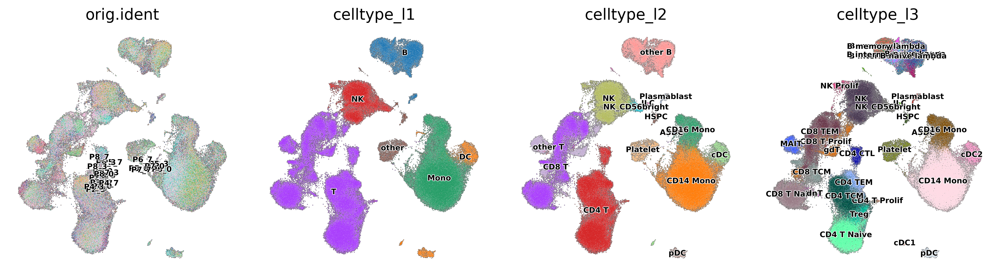

In [64]:
sc.set_figure_params(dpi = 150)
mu.pl.embedding(mdata_totalVI, 
                color=[
                    'orig.ident',
                    'celltype_l1',
                    'celltype_l2',
                    'celltype_l3'
                ],
                basis = 'X_umap_totalVI',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=4,
                wspace = 0, 
                hspace = 0.1)

In [68]:
mdata_totalVI.write_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_totalVI.h5mu')
del mdata_totalVI

# MOFA

In [69]:
mdata_mofa = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_unintegrated.h5mu')

In [70]:
mdata_mofa.mod["rna"] = mdata_mofa.mod["rna"][:, mdata_mofa.mod["rna"].var["highly_variable"]].copy()
mdata_mofa.update()

In [71]:
mu.tl.mofa(mdata_mofa, groups_label="orig.ident", gpu_mode=True, n_factors=20)


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='rna' group='P2_7' with N=6393 samples and D=2000 features...
Loaded view='rna' group='P1_7' with N=5861 samples and D=2000 features...
Loaded view='rna' group='P4_3' with N=5749 samples and D=2000 features...
Loaded view='rna' group='P3_7' with N=5930 samples and D=2000 features...
Loaded view='rna' group='P4_7' with N=5676 samples and D=2000 features...
Loaded view

In [72]:
mdata_mofa.obsm['X_mofa_harmony'] = harmonize(mdata_mofa.obsm['X_mofa'], 
                                         mdata_mofa.obs, 
                                         batch_key = 'orig.ident', 
                                         use_gpu = True,
                                         max_iter_harmony = 20)

Use GPU mode.
	Initialization is completed.
	Completed 1 / 20 iteration(s).
	Completed 2 / 20 iteration(s).
	Completed 3 / 20 iteration(s).
	Completed 4 / 20 iteration(s).
	Completed 5 / 20 iteration(s).
	Completed 6 / 20 iteration(s).
	Completed 7 / 20 iteration(s).
	Completed 8 / 20 iteration(s).
	Completed 9 / 20 iteration(s).
	Completed 10 / 20 iteration(s).
	Completed 11 / 20 iteration(s).
	Completed 12 / 20 iteration(s).
	Completed 13 / 20 iteration(s).
	Completed 14 / 20 iteration(s).
	Completed 15 / 20 iteration(s).
	Completed 16 / 20 iteration(s).
Reach convergence after 16 iteration(s).


In [73]:
sc.pp.neighbors(mdata_mofa, n_neighbors = 15, n_pcs=20, use_rep="X_mofa_harmony")
sc.tl.umap(mdata_mofa)
mdata_mofa.obsm["X_umap_mofa"] = mdata_mofa.obsm["X_umap"].copy()

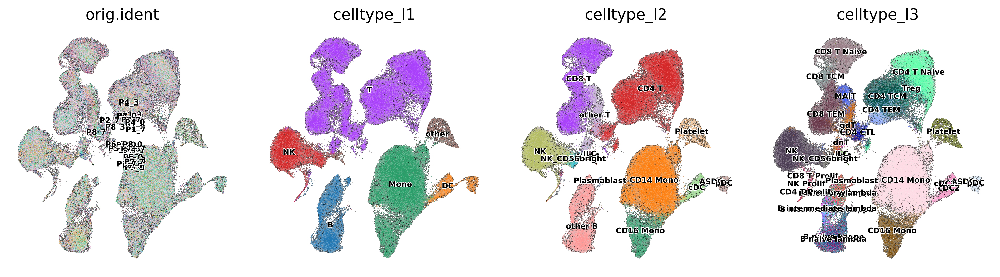

In [74]:
sc.set_figure_params(dpi = 150)
mu.pl.embedding(mdata_mofa, 
                color=[
                    'orig.ident',
                    'celltype_l1',
                    'celltype_l2',
                    'celltype_l3'
                ],
                basis = 'X_umap_mofa',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=4,
                wspace = 0, 
                hspace = 0.1)

In [75]:
mdata_mofa.write_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_mofa.h5mu')
del mdata_mofa

# Weighted Nearest Neighbor (WNN)

In [3]:
mdata_wnn = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_unintegrated.h5mu')
mdata_wnn

MuData object with n_obs × n_vars = 161010 × 21585
  obs:	'orig.ident', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'celltype_l3', 'celltype_l2', 'celltype_l1'
  var:	'gene_ids', 'feature_types'
  2 modalities
    rna:	161010 x 21361
      obs:	'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'celltype_l3', 'celltype_l2', 'celltype_l1'
      var:	'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
      uns:	'hvg', 'log1p', 'pca'
      obsm:	'X_pca'
      varm:	'PCs'
      layers:	'counts'
    adt:	161010 x 224
      obs:	'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'celltype_l3', 'celltype_l2', 'celltype_l1'
      var:	'gene_ids', 'feature_types'
      uns:	'pca'
      obsm:	'X_isotypes', 'X_pca'
      varm:	'PCs'
      layers:	'counts'

In [4]:
mdata_wnn.mod['rna'] = mdata_wnn.mod["rna"][:, mdata_wnn.mod["rna"].var["highly_variable"]].copy()
mdata_wnn.update()

In [5]:
# Integration rna modality using scANVI
scvi.model.SCVI.setup_anndata(mdata_wnn.mod['rna'], 
                              layer="counts", 
                              batch_key="orig.ident")
scvi_model_rna = scvi.model.SCVI(mdata_wnn.mod['rna'], 
                                 n_layers=2, 
                                 n_latent=20, 
                                 gene_likelihood="nb")
scvi_model_rna.train()
scanvi_model_rna = scvi.model.SCANVI.from_scvi_model(
    scvi_model_rna,
    adata=mdata_wnn.mod['rna'],
    labels_key="celltype_l3",
    unlabeled_category="Unknown",
)
scanvi_model_rna.train(max_epochs=10, n_samples_per_label=50)
mdata_wnn.mod['rna'].obsm['X_pca_scANVI_rna'] = scanvi_model_rna.get_latent_representation()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████████████████| 50/50 [45:08<00:00, 54.77s/it, v_num=1, train_loss_step=589, train_loss_epoch=598]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████████████| 50/50 [45:08<00:00, 54.18s/it, v_num=1, train_loss_step=589, train_loss_epoch=598]
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 10/10: 100%|██████████████████| 10/10 [11:25<00:00, 67.52s/it, v_num=1, train_loss_step=664, train_loss_epoch=593]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████████████| 10/10 [11:25<00:00, 68.60s/it, v_num=1, train_loss_step=664, train_loss_epoch=593]


In [6]:
# Integration adt modality using scANVI
scvi.model.SCVI.setup_anndata(mdata_wnn.mod['adt'], 
                              layer="counts", 
                              batch_key="orig.ident")
scvi_model_adt = scvi.model.SCVI(mdata_wnn.mod['adt'], 
                                 n_layers=2, 
                                 n_latent=20, 
                                 gene_likelihood="nb")
scvi_model_adt.train()
scanvi_model_adt = scvi.model.SCANVI.from_scvi_model(
    scvi_model_adt,
    adata=mdata_wnn.mod['adt'],
    labels_key="celltype_l3",
    unlabeled_category="Unknown",
)
scanvi_model_adt.train(max_epochs=10, n_samples_per_label=50)
mdata_wnn.mod['adt'].obsm['X_pca_scANVI_adt'] = scanvi_model_adt.get_latent_representation()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████████████████| 50/50 [39:08<00:00, 46.55s/it, v_num=1, train_loss_step=580, train_loss_epoch=562]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████████████| 50/50 [39:08<00:00, 46.97s/it, v_num=1, train_loss_step=580, train_loss_epoch=562]
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 10/10: 100%|██████████████████| 10/10 [10:04<00:00, 60.48s/it, v_num=1, train_loss_step=570, train_loss_epoch=560]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████████████| 10/10 [10:04<00:00, 60.43s/it, v_num=1, train_loss_step=570, train_loss_epoch=560]


In [7]:
# Calculate modality-specific neighbors
sc.pp.neighbors(mdata_wnn.mod['rna'], n_neighbors = 15, n_pcs=20, use_rep='X_pca_scANVI_rna')
sc.pp.neighbors(mdata_wnn.mod['adt'], n_neighbors = 15, n_pcs=20, use_rep='X_pca_scANVI_adt')

In [8]:
# Calculate weighted nearest neighbors
mu.pp.neighbors(mdata_wnn, key_added='wnn')

In [9]:
mu.tl.umap(mdata_wnn, neighbors_key='wnn')
mdata_wnn.obsm["X_umap_wnn"] = mdata_wnn.obsm["X_umap"].copy()

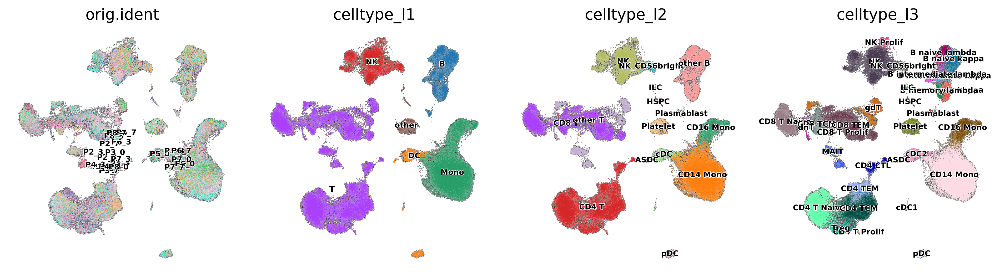

In [10]:
sc.set_figure_params(dpi = 150)
mu.pl.embedding(mdata_wnn, 
                color=[
                    'orig.ident',
                    'celltype_l1',
                    'celltype_l2',
                    'celltype_l3'
                ],
                basis = 'X_umap_wnn',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=4,
                wspace = 0, 
                hspace = 0.1)

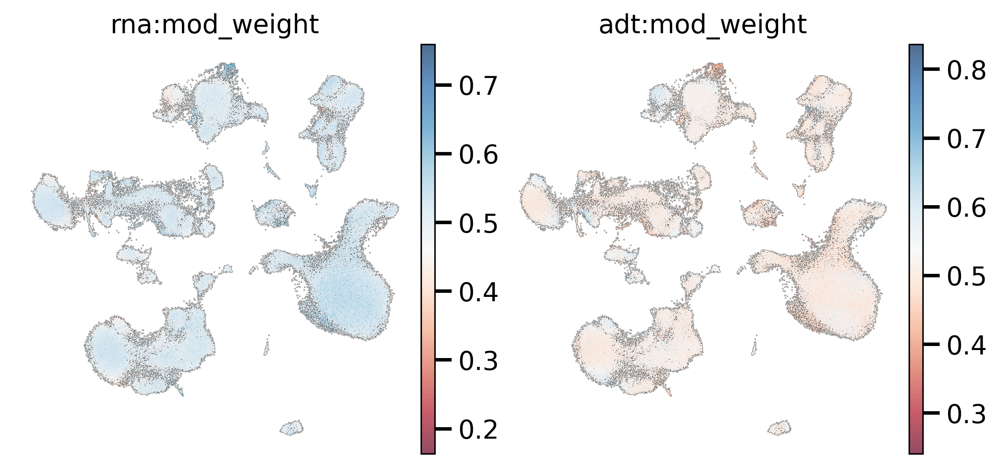

In [11]:
mu.pl.embedding(mdata_wnn, 
                color=[
                    'rna:mod_weight',
                    'adt:mod_weight'
                ],
                basis = 'X_umap_wnn',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                cmap='RdBu',
                legend_fontoutline = 1,
                ncols=2,
                wspace = 0.1, 
                hspace = 0.1)

In [12]:
mdata_wnn.write_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_wnn.h5mu')
del mdata_wnn

# PCA concatenation

In [78]:
mdata_wnn = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_wnn.h5mu')

In [14]:
del mdata_wnn.uns['wnn'], mdata_wnn.obsm['X_umap_wnn'], mdata_wnn.obsm['X_umap']
del mdata_wnn.obsp['wnn_connectivities'], mdata_wnn.obsp['wnn_distances']

In [15]:
mdata_concat = mdata_wnn.copy()

In [16]:
mdata_concat.obsm["X_pca_scANVI_concat"] = np.hstack([mdata_concat.mod["rna"].obsm["X_pca_scANVI_rna"][:, :20], mdata_concat.mod["adt"].obsm["X_pca_scANVI_adt"][:, :20]])
mdata_concat.update()

In [17]:
sc.pp.neighbors(mdata_concat, n_neighbors = 15, n_pcs=40, use_rep="X_pca_scANVI_concat")
sc.tl.umap(mdata_concat)
mdata_concat.obsm["X_umap_concat"] = mdata_concat.obsm["X_umap"].copy()

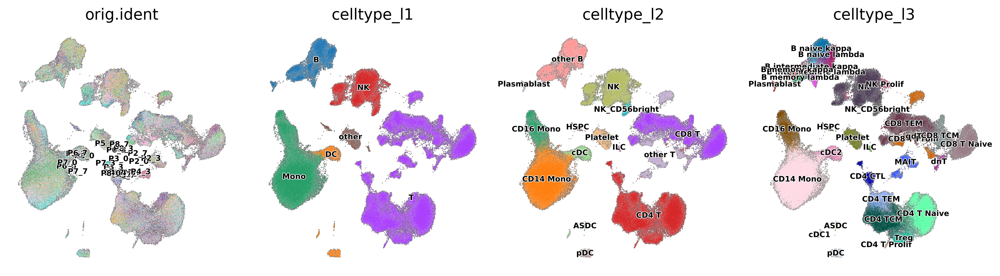

In [18]:
sc.set_figure_params(dpi = 150)
mu.pl.embedding(mdata_concat, 
                color=[
                    'orig.ident',
                    'celltype_l1',
                    'celltype_l2',
                    'celltype_l3'
                ],
                basis = 'X_umap_concat',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols=4,
                wspace = 0, 
                hspace = 0.1)

In [19]:
mdata_concat.write_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_PCA_concat.h5mu')

# Integration metrics

### TotalVI

In [4]:
mdata_totalVI = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_totalVI.h5mu')

In [39]:
scib_totalVI = sc.AnnData(mdata_totalVI.obsm["X_pca_totalVI"]).copy()
scib_totalVI.obs = mdata_totalVI.obs.copy()
scib_totalVI.obsp["connectivities"] = mdata_totalVI.obsp["connectivities"].copy()
scib_totalVI.obsm["X_pca_totalVI"] = mdata_totalVI.obsm["X_pca_totalVI"].copy()
del mdata_totalVI

In [40]:
metrics_totalVI = scib.metrics.metrics(scib_totalVI, 
                                       scib_totalVI, 
                                       batch_key="orig.ident",
                                       label_key="celltype_l3",
                                       embed="X_pca_totalVI",
                                       ari_=True,
                                       ilisi_=True,
                                       clisi_=True,
                                       nmi_=True,
                                       silhouette_=True,
                                       graph_conn_=True,
                                       isolated_labels_asw_=True,
                                       n_cores=10)
metrics_totalVI.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/metrics_integrated_totalVI.csv')
del scib_totalVI

NMI...
ARI...
Silhouette score...
Isolated labels ASW...
Graph connectivity...
cLISI score...
File has no entries. Doing nothing.
iLISI score...
File has no entries. Doing nothing.


### Mofa

In [41]:
mdata_mofa = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_mofa.h5mu')

In [42]:
scib_mofa = sc.AnnData(mdata_mofa.obsm["X_mofa_harmony"]).copy()
scib_mofa.obs = mdata_mofa.obs.copy()
scib_mofa.obsp["connectivities"] = mdata_mofa.obsp["connectivities"].copy()
scib_mofa.obsm["X_mofa_harmony"] = mdata_mofa.obsm["X_mofa_harmony"]
del mdata_mofa

In [43]:
metrics_mofa = scib.metrics.metrics(scib_mofa, 
                                    scib_mofa, 
                                    batch_key="orig.ident",
                                    label_key="celltype_l3",
                                    embed="X_mofa_harmony",
                                    ari_=True,
                                    ilisi_=True,
                                    clisi_=True,
                                    nmi_=True,
                                    silhouette_=True,
                                    graph_conn_=True,
                                    isolated_labels_asw_=True,
                                    n_cores=10)
metrics_mofa.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/metrics_integrated_mofa.csv')
del scib_mofa

NMI...
ARI...
Silhouette score...
Isolated labels ASW...
Graph connectivity...
cLISI score...
File has no entries. Doing nothing.
iLISI score...
File has no entries. Doing nothing.


### WNN

In [44]:
mdata_wnn = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_wnn.h5mu')

In [45]:
scib_wnn = sc.AnnData(mdata_wnn.mod['rna'].obsm["X_pca_scANVI_rna"]).copy()
scib_wnn.obs = mdata_wnn.obs.copy()
scib_wnn.obsp["connectivities"] = mdata_wnn.obsp["wnn_connectivities"].copy()
scib_wnn.obsm["X_pca_scANVI_rna"] = mdata_wnn.mod['rna'].obsm["X_pca_scANVI_rna"]
del mdata_wnn

In [46]:
metrics_wnn = scib.metrics.metrics(scib_wnn, 
                                   scib_wnn, 
                                   batch_key="orig.ident",
                                   label_key="celltype_l3",
                                   embed="X_pca_scANVI_rna",
                                   ari_=True,
                                   ilisi_=True,
                                   clisi_=True,
                                   nmi_=True,
                                   silhouette_=True,
                                   graph_conn_=True,
                                   isolated_labels_asw_=True,
                                   n_cores=10)
metrics_wnn.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/metrics_integrated_wnn.csv')
del scib_wnn

NMI...
ARI...
Silhouette score...
Isolated labels ASW...
Graph connectivity...
cLISI score...
File has no entries. Doing nothing.
iLISI score...
File has no entries. Doing nothing.


### PCA concatenation

In [47]:
mdata_concat = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/mdata_integrated_PCA_concat.h5mu')

In [48]:
scib_concat = sc.AnnData(mdata_concat.obsm["X_pca_scANVI_concat"]).copy()
scib_concat.obs = mdata_concat.obs.copy()
scib_concat.obsp["connectivities"] = mdata_concat.obsp["connectivities"].copy()
scib_concat.obsm["X_pca_scANVI_concat"] = mdata_concat.obsm["X_pca_scANVI_concat"].copy()
del mdata_concat

In [49]:
metrics_concat = scib.metrics.metrics(scib_concat, 
                                      scib_concat, 
                                      batch_key="orig.ident",
                                      label_key="celltype_l3",
                                      embed="X_pca_scANVI_concat",
                                      ari_=True,
                                      ilisi_=True,
                                      clisi_=True,
                                      nmi_=True,
                                      silhouette_=True,
                                      graph_conn_=True,
                                      isolated_labels_asw_=True,
                                      n_cores=10)
metrics_concat.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/metrics_integrated_PCA_concat.csv')
del scib_concat

NMI...
ARI...
Silhouette score...
Isolated labels ASW...
Graph connectivity...
cLISI score...
File has no entries. Doing nothing.
iLISI score...
File has no entries. Doing nothing.


# Metrics evaluation

In [11]:
metrics_totalVI = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_integrated_totalVI.csv', index_col=0)
metrics_mofa = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_integrated_mofa.csv', index_col=0)
metrics_wnn = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_integrated_wnn.csv', index_col=0)
metrics_concat = pd.read_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_integrated_PCA_concat.csv', index_col=0)

In [14]:
metrics = pd.DataFrame([metrics_totalVI['0'], metrics_mofa['0'], metrics_wnn['0'], metrics_concat['0']])
metrics = metrics.set_index(pd.Index(["TotalVI", "MOFA+", "WNN", "PCA concat"]))
metrics = metrics.dropna(axis=1)

In [16]:
metrics.style.background_gradient(cmap="Blues")

,NMI_cluster/label,ARI_cluster/label,ASW_label,ASW_label/batch,isolated_label_silhouette,graph_conn,iLISI,cLISI
TotalVI,0.856296,0.853863,0.571284,0.891966,0.554179,0.988004,0.263819,0.999502
MOFA+,0.838612,0.847409,0.571495,0.862649,0.442055,0.979711,0.307371,0.999318
WNN,0.870907,0.880383,0.637324,0.884234,0.605429,0.987295,0.264951,0.999763
PCA concat,0.887840,0.883433,0.637038,0.908864,0.563445,0.991395,0.248080,1.000000


In [17]:
# Calcuate average batch correction metrics and bio conservation metrics
metrics["batch_correction_metrics"] = (metrics["ASW_label/batch"] + metrics["graph_conn"] + metrics["iLISI"]) / 3
metrics["bio_conservation_metrics"] = (metrics["NMI_cluster/label"] + metrics["ARI_cluster/label"] + metrics["ASW_label"] + metrics["isolated_label_silhouette"] + metrics["cLISI"]) / 5

In [18]:
# Following the scIB publication (Benchmarking atlas-level data integration in single-cell genomics): 
# overall score = 0.4 * batch_correction_metrics + 0.6 * bio_conservation_metrics
metrics["overall"] = 0.4 * metrics["batch_correction_metrics"] + 0.6 * metrics["bio_conservation_metrics"]

In [19]:
metrics.style.background_gradient(cmap="Blues")

,NMI_cluster/label,ARI_cluster/label,ASW_label,ASW_label/batch,isolated_label_silhouette,graph_conn,iLISI,cLISI,batch_correction_metrics,bio_conservation_metrics,overall
TotalVI,0.856296,0.853863,0.571284,0.891966,0.554179,0.988004,0.263819,0.999502,0.714596,0.767025,0.746053
MOFA+,0.838612,0.847409,0.571495,0.862649,0.442055,0.979711,0.307371,0.999318,0.716577,0.739778,0.730498
WNN,0.870907,0.880383,0.637324,0.884234,0.605429,0.987295,0.264951,0.999763,0.712160,0.798761,0.764121
PCA concat,0.887840,0.883433,0.637038,0.908864,0.563445,0.991395,0.248080,1.000000,0.716113,0.794351,0.763056


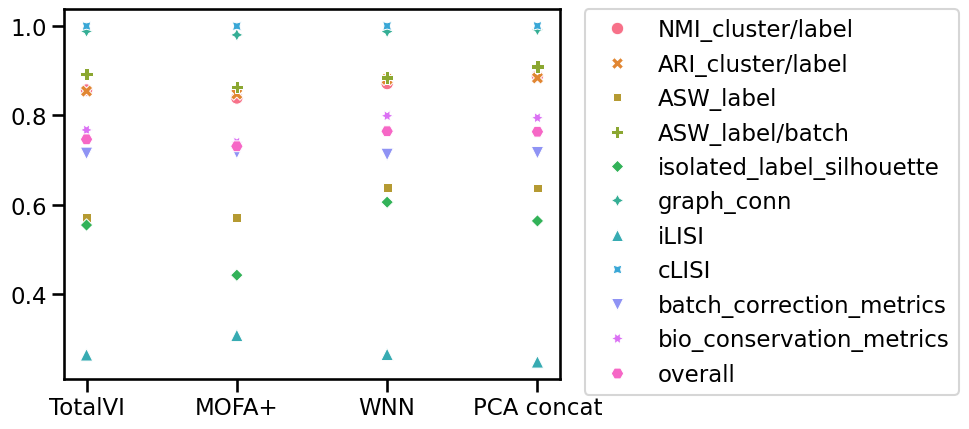

In [75]:
sns.scatterplot(data=metrics)
legend = plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0)
plt.savefig('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_final.png', bbox_extra_artists=(legend,), bbox_inches='tight') 

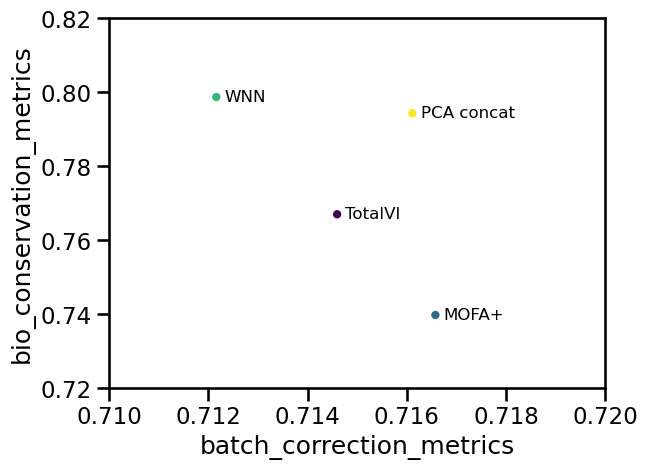

In [76]:
fig, ax = plt.subplots()
ax.set_xlim(0.71, 0.72)
ax.set_ylim(0.72, 0.82)
metrics.plot.scatter(
    x="batch_correction_metrics",
    y="bio_conservation_metrics",
    c=range(len(metrics)),
    ax=ax,
)

for k, v in metrics[["batch_correction_metrics", "bio_conservation_metrics"]].iterrows():
    ax.annotate(
        k,
        v,
        xytext=(6, -3),
        textcoords="offset points",
        family="sans-serif",
        fontsize=12,
    )
plt.savefig('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/metrics_plot.png', bbox_inches='tight') 

In [22]:
metrics.to_csv('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/metrics_final.csv')

<Axes: >

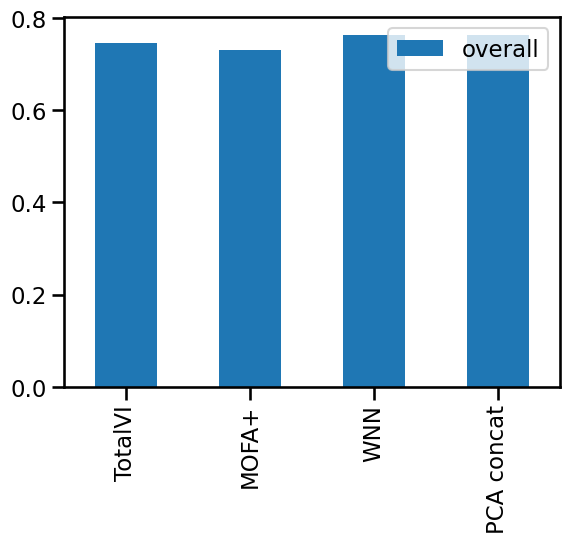

In [62]:
metrics.plot.bar(y="overall")

# Visualization of integration

In [5]:
# Function for beautiful plot
from adjustText import adjust_text
import matplotlib.patheffects as pe

def gen_mpl_labels(
    adata, groupby, exclude=(), ax=None, adjust_kwargs=None, text_kwargs=None, color_by_group=False
):
    if adjust_kwargs is None:
        adjust_kwargs = {"text_from_points": False}
    if text_kwargs is None:
        text_kwargs = {}

    medians = {}

    for g, g_idx in adata.obs.groupby(groupby).groups.items():
        if g in exclude:
            continue
        medians[g] = np.median(adata[g_idx].obsm["X_umap"], axis=0)

    # Fill the text colors dictionary
    text_colors = {group: None for group in adata.obs[groupby].cat.categories}

    if color_by_group and groupby + "_colors" in adata.uns:
        for i, group in enumerate(adata.obs[groupby].cat.categories):
            if group in exclude:
                continue
            text_colors[group] = adata.uns[groupby + "_colors"][i]

    if ax is None:
        texts = [
            plt.text(x=x, y=y, s=k, color=text_colors[k], **text_kwargs) for k, (x, y) in medians.items()
        ]
    else:
        texts = [ax.text(x=x, y=y, s=k, color=text_colors[k], **text_kwargs) for k, (x, y) in medians.items()]

    adjust_text(texts, **adjust_kwargs)
    

In [94]:
# TotalVI
mdata = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_totalVI.h5mu')
# MOFA
# mdata = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_mofa.h5mu')
# WNN
# mdata = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_wnn.h5mu')
# PCA concatenation
# mdata = mu.read_h5mu('/mnt/c/Users/vadim/Desktop/R/PBMC_ref/CITEseq/3p/mdata_integrated_PCA_concat.h5mu')

In [96]:
basis = 'X_umap_totalVI'
# basis = 'X_umap_mofa'
# basis = 'X_umap_wnn'
# basis = 'X_umap_concat'

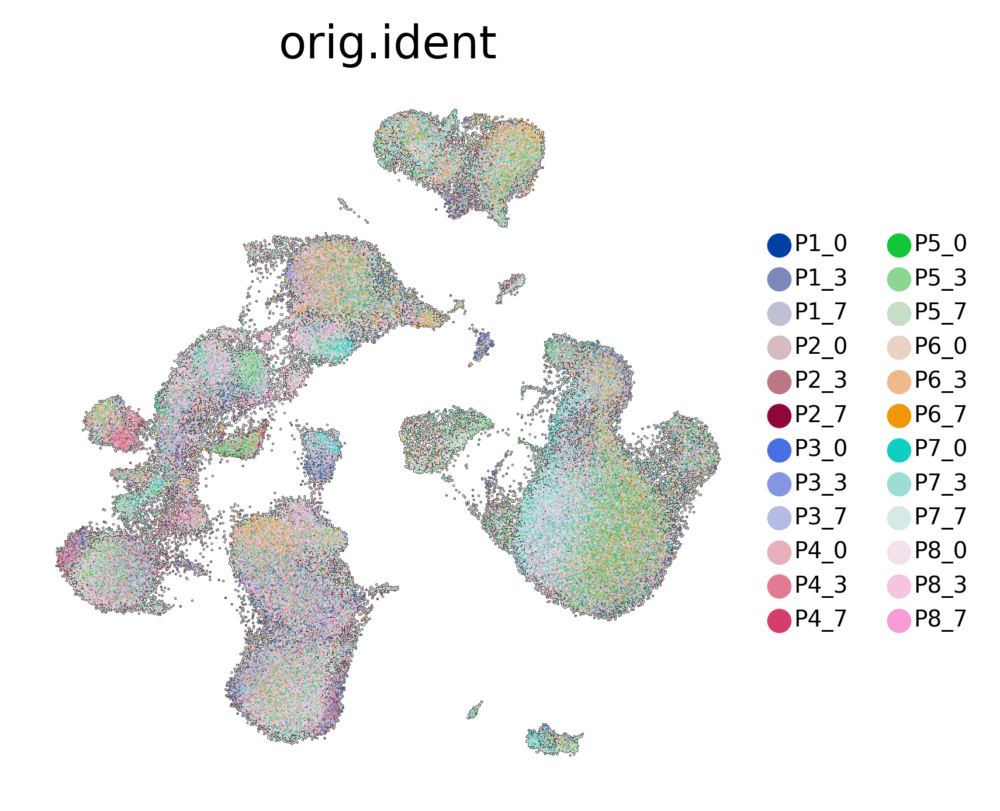

In [97]:
sc.set_figure_params(dpi = 200, dpi_save = 300)
celltype = 'orig.ident'
mu.pl.embedding(mdata, 
                color=[
                    celltype
                ],
                basis = basis,
                frameon = False,
                add_outline = True,
                legend_loc = 'right margin',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                save = '_' + celltype + '.png')

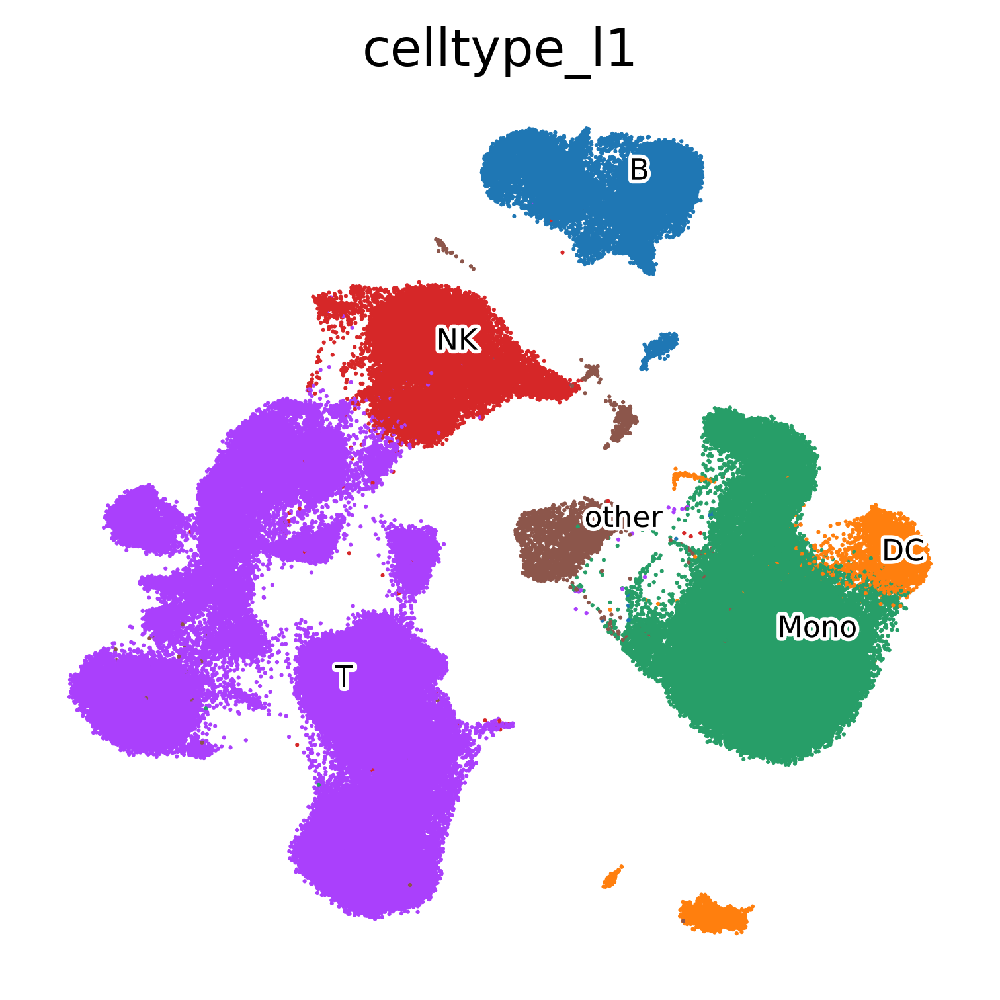

In [98]:
celltype = 'celltype_l1'
with plt.rc_context({"figure.dpi": 200, 'savefig.dpi':300, "figure.frameon": False}):
    ax = mu.pl.embedding(mdata, 
                         color = celltype, 
                         basis = basis, 
                         show = False,
                         size = 5,
                         legend_loc = None, 
                         add_outline = False, 
                         frameon = False)
    gen_mpl_labels( 
        mdata,
        celltype,
        exclude=("None",),  # This was before we had the `nan` behaviour
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=8, path_effects=[pe.withStroke(linewidth=2, foreground="white")]),
        color_by_group=False
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.show()
fig.savefig('figures/' + basis + '_' + celltype + '.png')

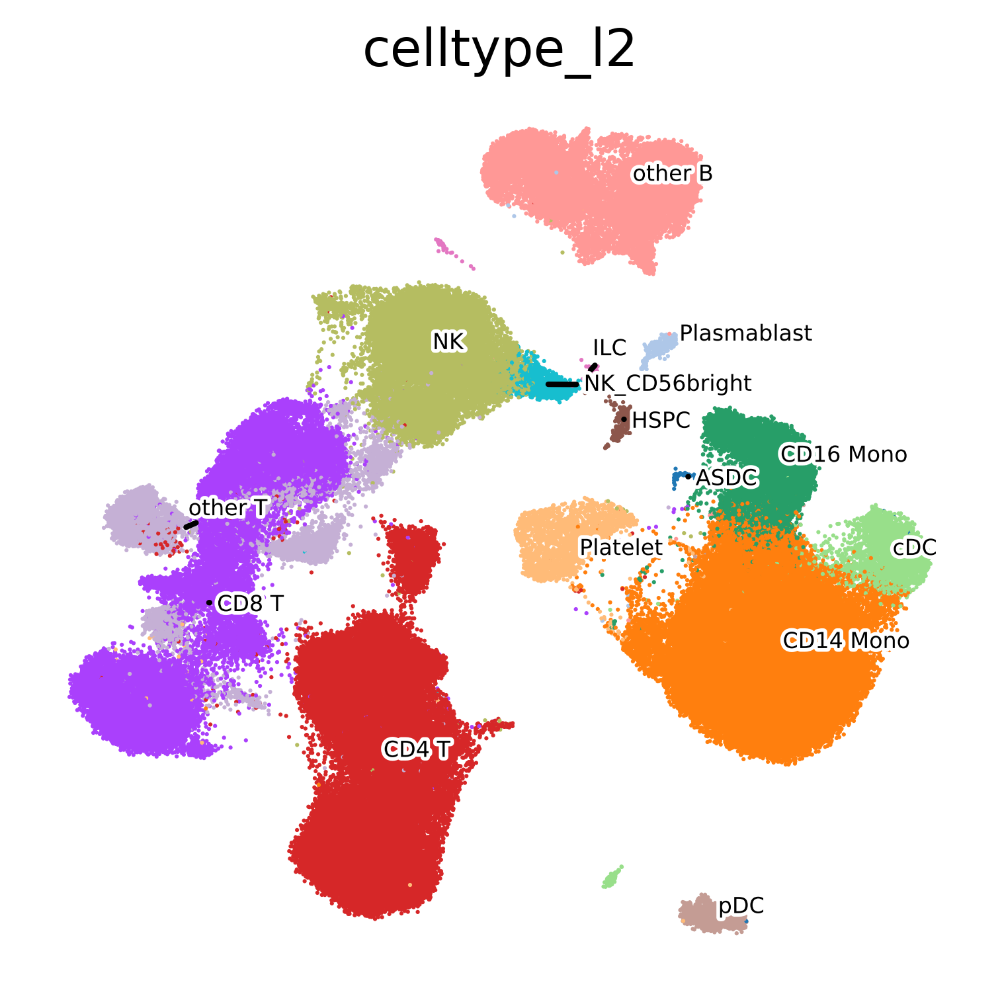

In [99]:
celltype = 'celltype_l2'
with plt.rc_context({"figure.dpi": 200, 'savefig.dpi':300, "figure.frameon": False}):
    ax = mu.pl.embedding(mdata, 
                         color = celltype, 
                         basis = basis, 
                         show = False,
                         size = 5,
                         legend_loc = None, 
                         add_outline = False, 
                         frameon = False)
    gen_mpl_labels( 
        mdata,
        celltype,
        exclude=("None",),  # This was before we had the `nan` behaviour
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=6, path_effects=[pe.withStroke(linewidth=2, foreground="white")]),
        color_by_group=False
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.show()
fig.savefig('figures/' + basis + '_' + celltype + '.png')

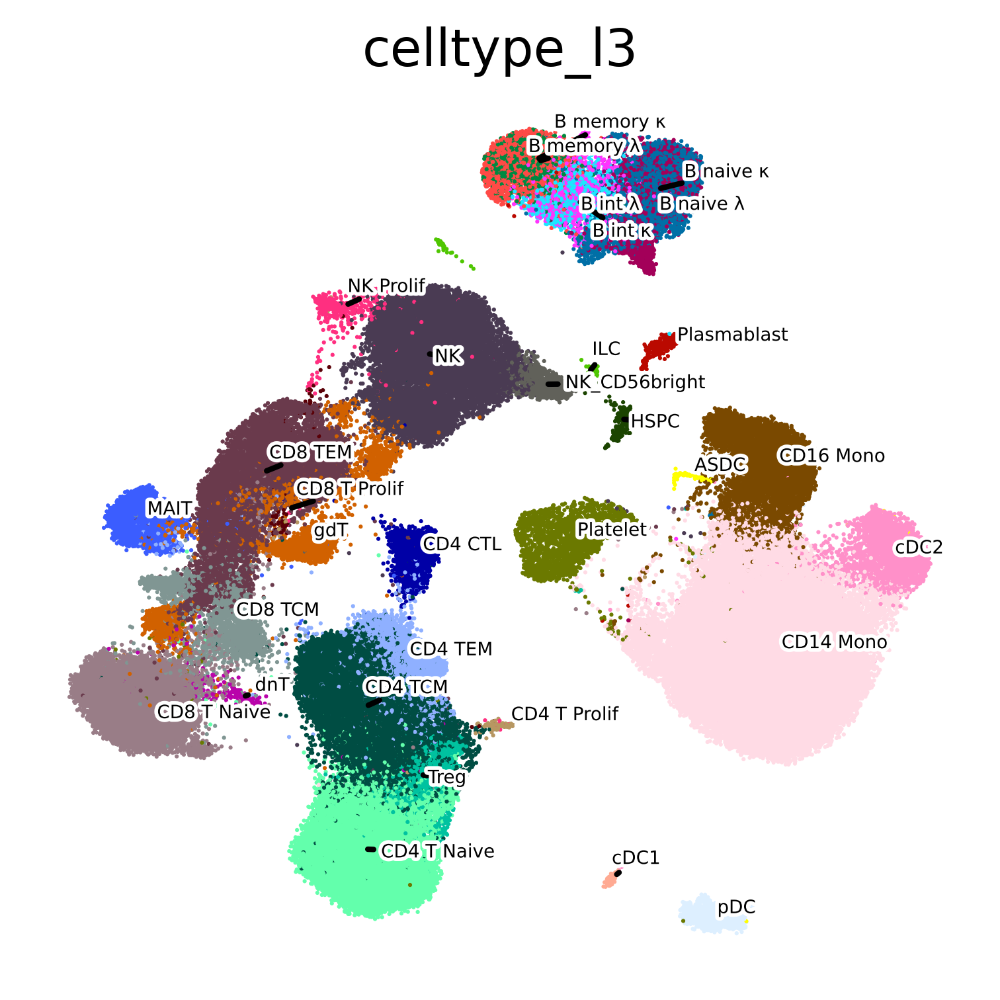

In [100]:
celltype = 'celltype_l3'
with plt.rc_context({"figure.dpi": 200, 'savefig.dpi':300, "figure.frameon": False}):
    ax = mu.pl.embedding(mdata, 
                         color = celltype, 
                         basis = basis, 
                         show = False,
                         size = 5,
                         legend_loc = None, 
                         add_outline = False, 
                         frameon = False)
    gen_mpl_labels( 
        mdata,
        celltype,
        exclude=("None",),  # This was before we had the `nan` behaviour
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=5, path_effects=[pe.withStroke(linewidth=2, foreground="white")]),
        color_by_group=False
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.show()
fig.savefig('figures/' + basis + '_' + celltype + '.png')

In [23]:
pip list

Package                   Version
------------------------- --------------
absl-py                   2.1.0
adjustText                1.2.0
aiohappyeyeballs          2.3.6
aiohttp                   3.10.3
aiosignal                 1.3.1
alembic                   1.13.2
anndata                   0.10.8
annoy                     1.17.3
anyio                     4.4.0
appdirs                   1.4.4
argon2-cffi               23.1.0
argon2-cffi-bindings      21.2.0
array_api_compat          1.8
arrow                     1.3.0
asttokens                 2.4.1
async-lru                 2.0.4
attrs                     24.2.0
Babel                     2.14.0
beautifulsoup4            4.12.3
bleach                    6.1.0
bokeh                     3.4.2
branca                    0.7.2
Brotli                    1.1.0
cached-property           1.5.2
cachetools                5.4.0
certifi                   2024.7.4
cffi                      1.17.0
charset-normalizer        3.3.2
chex              